#Assignment 1-Data Science


1.Name: Viral Jangale

2.NUID: 002654463

#Abstarct


The goal was to create a realistic model that could accurately predict the price of houses in Melbourne. It is widely assumed that it is impossible to accurately predict the price of a house because it is affected by a variety of factors. Price is the dependent variable in this dataset, while the others are independent variables. First, major factors influencing housing prices should be identified. Then, using linear regression, a model for predicting housing prices should be developed. To put the model to the test, use the Melbourne housing dataset. The data analysis and testing results show that the linear regression model can predict and analyze housing prices to some extent, but the algorithm can still be improved using more advanced machine learning methods.

#Dataset

This is a  static snapshot of a dataset created by Tony Pino.

It was scraped from publicly available results posted every week from Domain.com.au. He cleaned it well, and now it's up to you to make data analysis magic. The dataset includes Address, Type of Real estate, Suburb, Method of Selling, Rooms, Price, Real Estate Agent, Date of Sale and distance from C.B.D.<br>
Notes on Specific Variables
Rooms: Number of rooms<br>
Price: Price in dollars<br>
Method: S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN - sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed. N/A - price or highest bid not available.<br>
Type: br - bedroom(s); h - house,cottage,villa, semi,terrace; u - unit, duplex; t - townhouse; dev site - development site; o res - other residential.<br>
SellerG: Real Estate Agent<br>
Date: Date sold<br>
Distance: Distance from CBD<br>
Regionname: General Region (West, North West, North, North east …etc)<br>
Propertycount: Number of properties that exist in the suburb.<br>
Bedroom2 : Scraped # of Bedrooms (from different source)<br>
Bathroom: Number of Bathrooms<br>
Car: Number of carspots<br>
Landsize: Land Size<br>
BuildingArea: Building Size<br>
CouncilArea: Governing council for the area

#Importing required Libraries

In [3]:
#importing all the important libraries
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import numpy as np
import pandas as pd
import random
import os
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from scipy.stats import skew, norm
from scipy import stats
from scipy.stats import norm, skew 
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
from yellowbrick.regressor import ResidualsPlot

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

pd.set_option('display.max_columns', None)

from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
import scipy
from sklearn.impute import KNNImputer


import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np

#%%capture
#this library can be used for validation as well as visualization of data 
#!pip install -q tensorflow_data_validation[visualization]

In [5]:
df=pd.read_csv("https://github.com/Viral-28/Datascience/raw/main/datasciencemelbourne.csv")

#Reading and Studying the data

In [6]:
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,0,2790,1,0,839,1,18,41,12,50,2,0,0,110,85,23,29,1712,1839,2,135
1,0,4520,2,0,1118,3,18,42,12,50,3,1,0,88,224,23,29,1690,1854,2,135
2,0,4882,3,0,1174,4,112,43,12,50,3,0,2,74,212,130,29,1722,1851,2,135
3,0,1027,2,0,1291,1,112,46,12,50,4,1,0,198,313,32,29,1788,1932,2,135
4,0,6101,1,0,1193,1,112,50,12,50,2,0,2,209,143,17,29,1737,1869,2,135


In [7]:
df.shape

(6196, 21)

#Checing Nulls in Dataset

In [8]:
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6196 entries, 0 to 6195
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Suburb         6196 non-null   int64
 1   Address        6196 non-null   int64
 2   Rooms          6196 non-null   int64
 3   Type           6196 non-null   int64
 4   Price          6196 non-null   int64
 5   Method         6196 non-null   int64
 6   SellerG        6196 non-null   int64
 7   Date           6196 non-null   int64
 8   Distance       6196 non-null   int64
 9   Postcode       6196 non-null   int64
 10  Bedroom2       6196 non-null   int64
 11  Bathroom       6196 non-null   int64
 12  Car            6196 non-null   int64
 13  Landsize       6196 non-null   int64
 14  BuildingArea   6196 non-null   int64
 15  YearBuilt      6196 non-null   int64
 16  CouncilArea    6196 non-null   int64
 17  Lattitude      6196 non-null   int64
 18  Longtitude     6196 non-null   int64
 19  Region

In [9]:
df.isnull().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
YearBuilt        0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

For this dataset there is no missing value.

#Checking Distribution of Variables

For linear regression all the variables must follow a normal distribution. So to check the distribution following code should be computed.

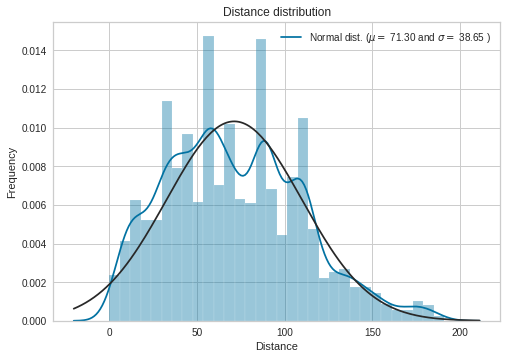

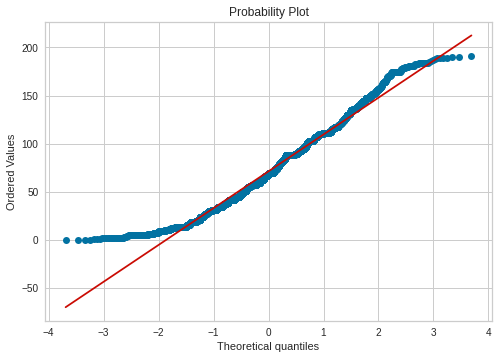

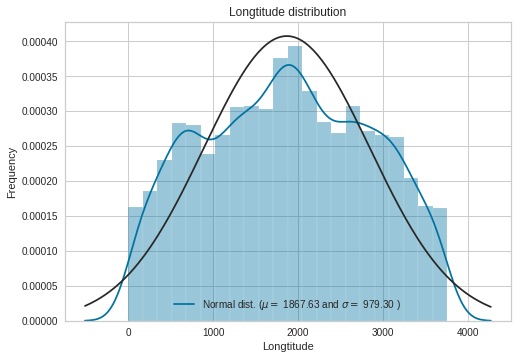

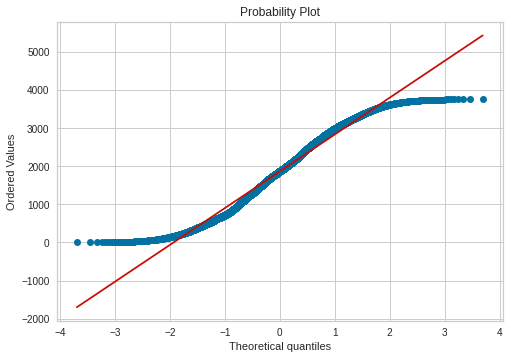

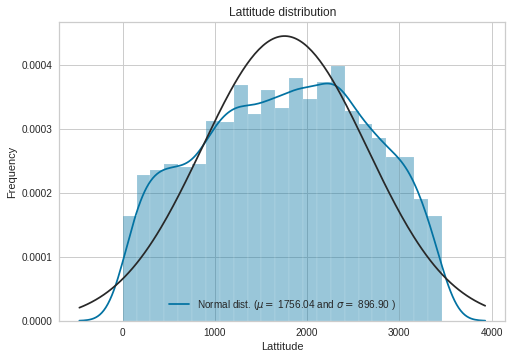

...

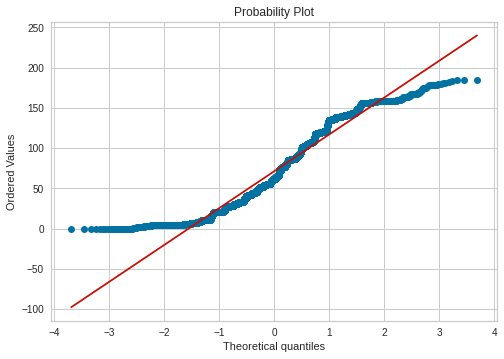

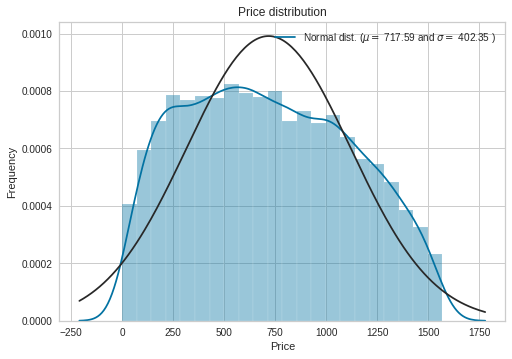

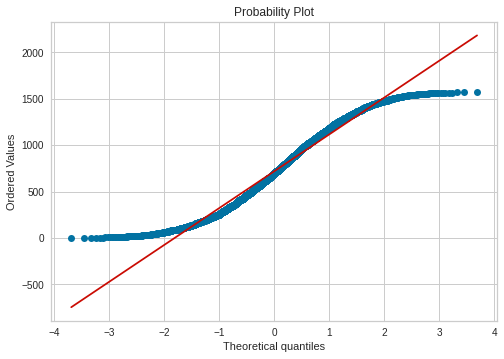

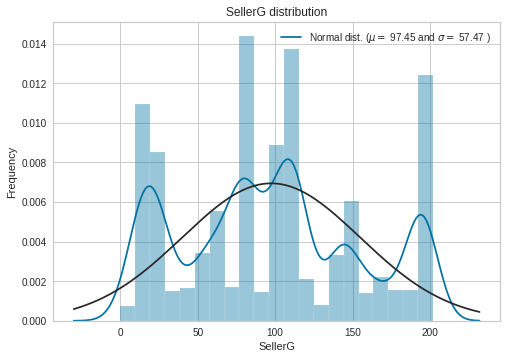

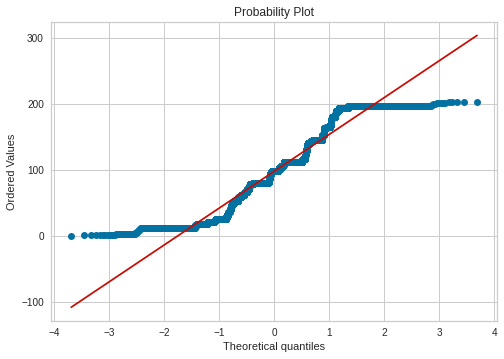

In [10]:
sns.distplot(df['Distance'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Distance'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Distance distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Distance'], plot=plt)
plt.show()


sns.distplot(df['Longtitude'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Longtitude'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Longtitude distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Longtitude'], plot=plt)
plt.show()

sns.distplot(df['Lattitude'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Lattitude'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Lattitude distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Lattitude'], plot=plt)
plt.show()

sns.distplot(df['BuildingArea'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['BuildingArea'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('BuildingArea distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['BuildingArea'], plot=plt)
plt.show()


sns.distplot(df['Postcode'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Postcode'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Postcode distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Postcode'], plot=plt)
plt.show()

sns.distplot(df['Price'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Price'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Price distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Price'], plot=plt)
plt.show()


sns.distplot(df['SellerG'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['SellerG'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SellerG distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['SellerG'], plot=plt)
plt.show()



For the given dataset I plotted q-q plot and bell-curve for some of the independent variables. It is observed that all of them roughly follow normal distribution.

Other variables like 'Room','Bathrooms','Car, and'Type' are categorical variables and hence have not plotted their distribution.



#Analysing Relationship between all variables

The correlation matrix is nothing more than a table of correlations. Each random variable in the table has a relationship with every other value in the table. This enables us to determine which pairs have the greatest correlation. It also indicates whether it is directly or inversely dependent by denoting positive and negative signs.

This is one of the methods for determining which independent variables are useful in predicting a target variable. Other methods for determining the importance of independent variables besides the correlation matrix include the pairplot against the target variable and calculating the p-value.

Representing the same matrix in form of heatmap where shades of blue signify inverse relation and shades of red signify direct relation.

Text(0.5, 1.0, 'Variable Correlation')

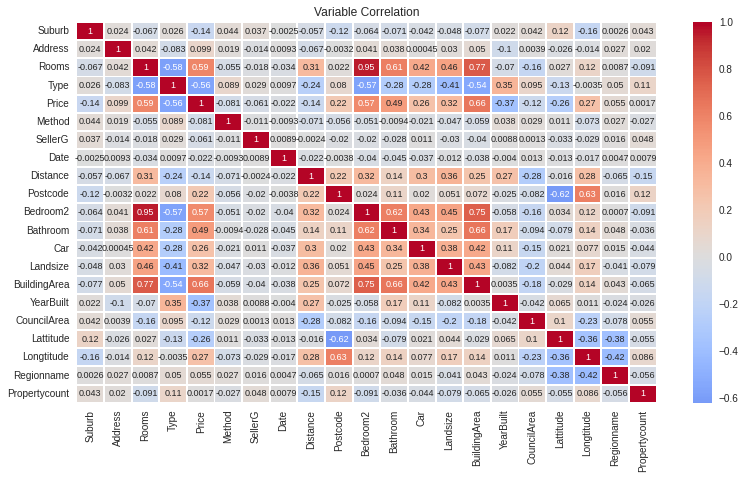

In [11]:
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(13,7))

sns.heatmap(df.corr(),center=0, linewidths=0.9,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

Plotting all variables against each other to see if there is a relationship between them. It essentially tells the same story as the correlation matrix, but in a graphical format.

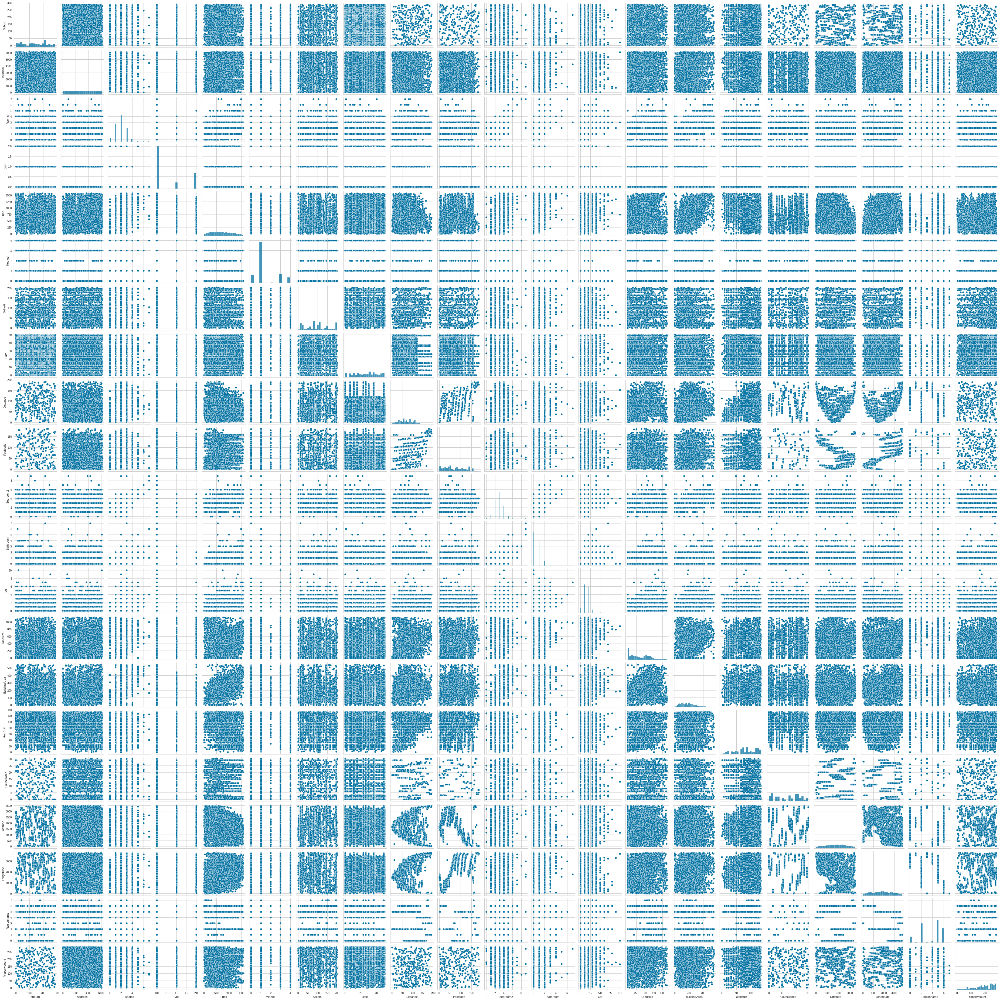

In [12]:
sns.pairplot(df)


We can determine which variables help the most in predicting the target variable based on the correlation matrix and plots. We can determine this from the matrix by looking at which variables values are close to 1. The values of 'BuildingArea,' 'Rooms,' and 'Bedroom2' are all close to one. When all independent variables are plotted against the 'price' variable, a roughly linear line is obtained for 'Landsize' and 'BuildingArea'. As a result of this plot, it is possible to conclude that the variables Landsize and BuildingArea have a linear relationship with Price.

It is clear from the plot and the matrix that multicollinearity exists between independent variables.

To calculate the p-value and VIF, first we need to seperate the target variable from the independent ones and then the data into testing and training dataset.

In [13]:
X=df.drop(['Price'],axis=1)
y=df['Price']

In [14]:
X_train,X_test,y_train,y_test=tts(X,y,test_size=0.2,random_state=42)

In [15]:
#Calculating VIF 
vif_data = pd.DataFrame()
vif_data["feature"] = X_train.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train.values, i)
                          for i in range(len(X_train.columns))]
  
print(vif_data)

          feature        VIF
0          Suburb   3.971947
1         Address   4.008772
2           Rooms  53.756730
3            Type   3.095120
4          Method   2.585650
5         SellerG   3.769657
6            Date   4.125136
7        Distance   7.626206
8        Postcode   8.192933
9        Bedroom2  94.086678
10       Bathroom   3.464902
11            Car   5.312394
12       Landsize   3.924441
13   BuildingArea  13.088665
14      YearBuilt  10.525404
15    CouncilArea   3.786261
16      Lattitude   7.911781
17     Longtitude  10.823703
18     Regionname   6.559713
19  Propertycount   8.062638


Variables with high collinearity have VIF value above 10. According to the output 'Rooms' , 'Bedroom2' and 'BuildingArea' have VIF greater than 10 so this tells us that there is multicollinearity among these variables.

In [16]:
X_train.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Method', 'SellerG', 'Date',
       'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize',
       'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude', 'Longtitude',
       'Regionname', 'Propertycount'],
      dtype='object')

In [17]:
cols= ['Suburb', 'Address', 'Rooms', 'Type', 'Method', 'SellerG', 'Date','Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize','BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude', 'Longtitude',
       'Regionname', 'Propertycount']
model = sm.OLS(y_train,sm.add_constant(X_train[cols])).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.791
Method:                 Least Squares   F-statistic:                     936.5
Date:                Fri, 03 Feb 2023   Prob (F-statistic):               0.00
Time:                        19:36:57   Log-Likelihood:                -32863.
No. Observations:                4956   AIC:                         6.577e+04
Df Residuals:                    4935   BIC:                         6.590e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           771.1710     27.940     27.601

P-value below 0.05 means that variable is significnt. For this dataset all variables except 'Address' 'Bedroom2' and 'Date' are significant variables.

For model we need to have variables that are significantly important and have no or very less collinearity. For this dataset, all variables with p value greeater than 0.05 should be dropped and also som variableswith high VIF value. So 'Address' 'Bedroom2' and 'Date' should be dropped to improve the accuracy.

In [18]:
df=df.drop(['Address','Bedroom2','Date'],axis=1)

In [19]:
df.shape

(6196, 18)

In [20]:
X=df.drop(['Price'],axis=1)
y=df['Price']

In [21]:
X_train,X_test,y_train,y_test=tts(X,y,test_size=0.2,random_state=42)

In [22]:
X_train.columns

Index(['Suburb', 'Rooms', 'Type', 'Method', 'SellerG', 'Distance', 'Postcode',
       'Bathroom', 'Car', 'Landsize', 'BuildingArea', 'YearBuilt',
       'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname',
       'Propertycount'],
      dtype='object')

In [23]:
X_train.columns

Index(['Suburb', 'Rooms', 'Type', 'Method', 'SellerG', 'Distance', 'Postcode',
       'Bathroom', 'Car', 'Landsize', 'BuildingArea', 'YearBuilt',
       'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname',
       'Propertycount'],
      dtype='object')

In [24]:
cols1= ['Suburb', 'Rooms', 'Type', 'Method', 'SellerG', 'Distance', 'Postcode','Bathroom', 'Car', 'Landsize', 'BuildingArea', 'YearBuilt',
'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname','Propertycount']

#Checking Range of variables and Outliers

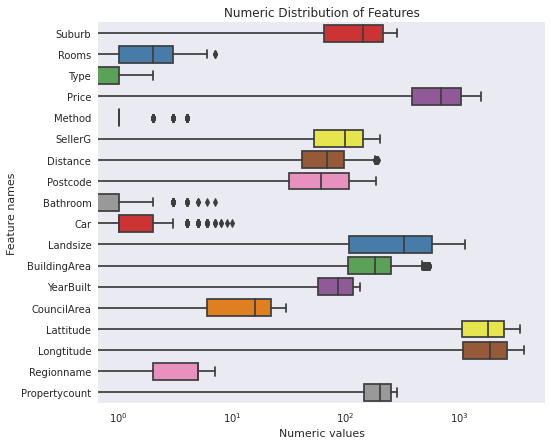

In [25]:
#Checking the range of predictor/independent variable
sns.set_style("darkgrid")
f, ax = plt.subplots(figsize=(8, 7))
ax.set_xscale("log")
ax = sns.boxplot(data=df, orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature names")
ax.set(xlabel="Numeric values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)

From the boxpot of independent variable we can determine the range of value of each variable. From this it can be observed that the values of all variables are scattered. From this plot it is observed that 'Method','Bathroom' ,'Car' and 'Rooms' have outliers.

First to normalize the data total number of numerical features whose skewnesss is greater than 0.5 should be calculated.



In [26]:
# Find skewed numerical features
skew_features = df.apply(lambda x: skew(x)).sort_values(ascending=False)

high_skew = skew_features[skew_features > 0.5]
skew_index = high_skew.index

print("There are {} numerical features with Skew > 0.5 :".format(high_skew.shape[0]))
skewness = pd.DataFrame({'Skew' :high_skew})

There are 5 numerical features with Skew > 0.5 :


By using scipy function boxcox1p Box-Cox transformation is computred.This was done as the goal was to find a simple transformation that lets us normalize data. After normalizing when boxplot was plotted again, all the values of variables were not scattered.

In [27]:
# Normalize skewed features
for i in skew_index:
    df[i] = boxcox1p(df[i], boxcox_normmax(df[i] + 1))

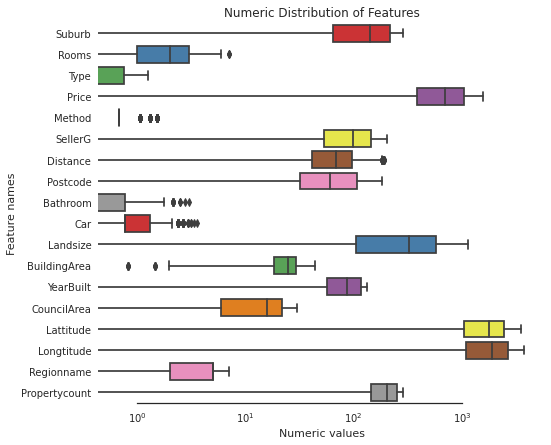

In [28]:
#Checking the range of predictor/independent variable
sns.set_style("white")
f, ax = plt.subplots(figsize=(8, 7))
ax.set_xscale("log")
ax = sns.boxplot(data=df, orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature names")
ax.set(xlabel="Numeric values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)

#Executing Linear Regression with Outliers

In [29]:
def linear_reg(X_train,y_train,X_test,y_test):
    linear_reg = LinearRegression()
    linear_reg_model = linear_reg.fit(X_train,y_train)
    print('Train set')
    pred=linear_reg_model.predict(X_train)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_train,pred)))
    print('Test set')
    pred=linear_reg_model.predict(X_test)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_test,pred))) 
    
    plt.scatter(y_test,pred,color='gray')
    plt.xlabel('Actual values')
    plt.ylabel('Predicted values')
    plt.plot(np.unique(y_test), np.poly1d(np.polyfit(y_test, pred, 1))(np.unique(y_test)))
    plt.text(0.6, 0.5, 'R-squared = %0.2f' % r2_score(y_test,pred))
    plt.show()
    df = pd.DataFrame({'Actual': y_test, 'Predicted': pred})
    df1 = df.head(30)
    df1.plot(kind='bar',figsize=(10,8))
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.show()
    visualizer = ResidualsPlot(linear_reg_model)
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.poof() 

Train set
Linear Regression Mean Squared error :33658.61845667005
Linear Regression r2_score :0.7914411252916436
Test set
Linear Regression Mean Squared error :33481.48528671196
Linear Regression r2_score :0.7956522564362258


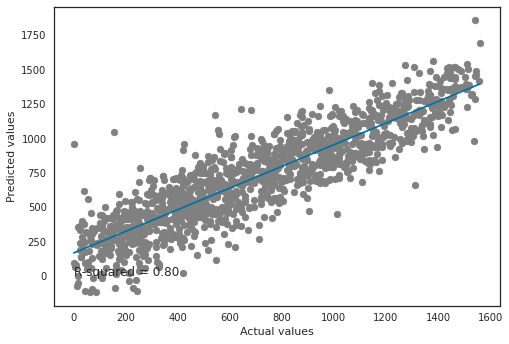

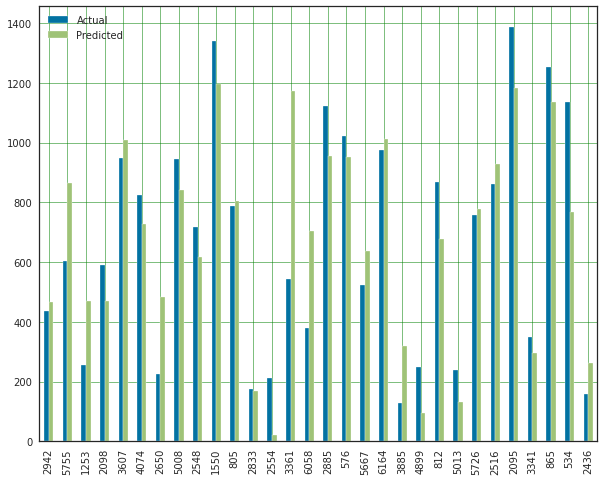

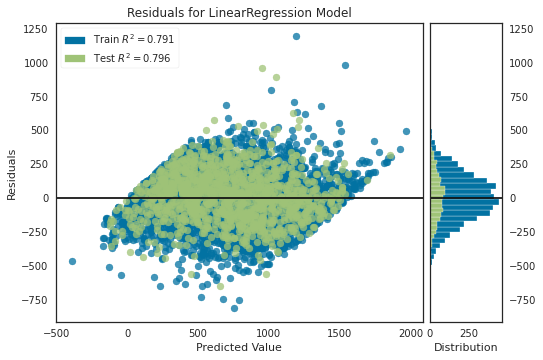

In [30]:
linear_reg(X_train[cols1],y_train,X_test[cols1],y_test)

#Removing Outliers

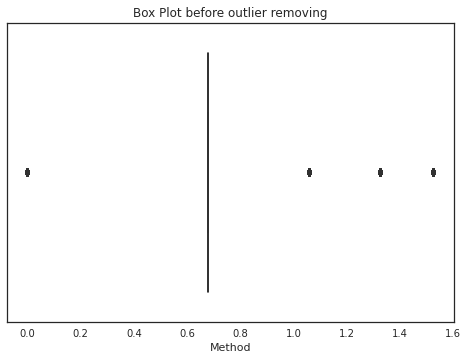

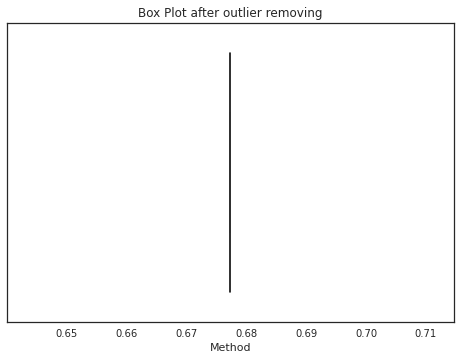

In [31]:
sns.boxplot(df['Method'])
plt.title("Box Plot before outlier removing")
plt.show()
def drop_outliers(df, field_name):
    iqr = 1.5 * (np.percentile(df[field_name], 75) - np.percentile(df[field_name], 25))
    df.drop(df[df[field_name] > (iqr + np.percentile(df[field_name], 75))].index, inplace=True)
    df.drop(df[df[field_name] < (np.percentile(df[field_name], 25) - iqr)].index, inplace=True)
drop_outliers(df, 'Method')
sns.boxplot(df['Method'])
plt.title("Box Plot after outlier removing")
plt.show()

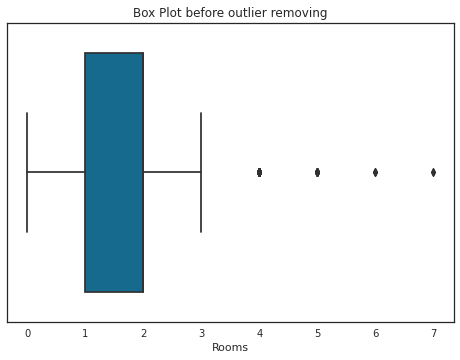

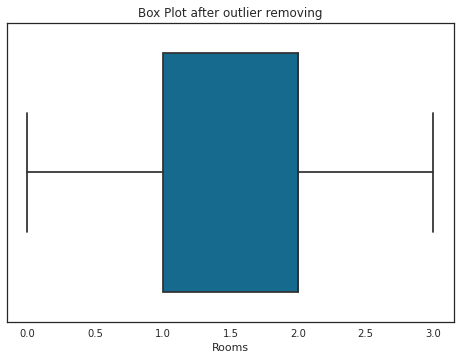

In [32]:
sns.boxplot(df['Rooms'])
plt.title("Box Plot before outlier removing")
plt.show()
def drop_outliers(df, field_name):
    iqr = 1.5 * (np.percentile(df[field_name], 75) - np.percentile(df[field_name], 25))
    df.drop(df[df[field_name] > (iqr + np.percentile(df[field_name], 75))].index, inplace=True)
    df.drop(df[df[field_name] < (np.percentile(df[field_name], 25) - iqr)].index, inplace=True)
drop_outliers(df, 'Rooms')
sns.boxplot(df['Rooms'])
plt.title("Box Plot after outlier removing")
plt.show()

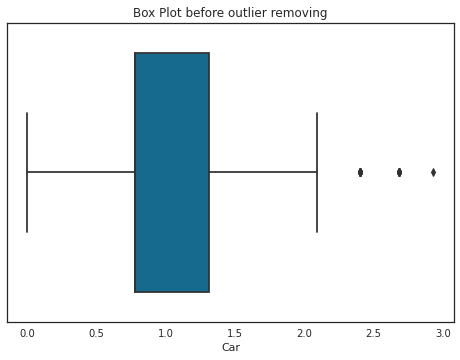

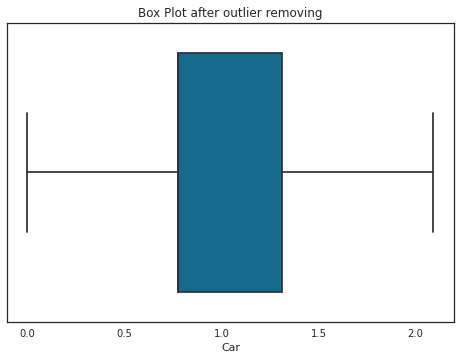

In [33]:
sns.boxplot(df['Car'])
plt.title("Box Plot before outlier removing")
plt.show()
def drop_outliers(df, field_name):
    iqr = 1.5 * (np.percentile(df[field_name], 75) - np.percentile(df[field_name], 25))
    df.drop(df[df[field_name] > (iqr + np.percentile(df[field_name], 75))].index, inplace=True)
    df.drop(df[df[field_name] < (np.percentile(df[field_name], 25) - iqr)].index, inplace=True)
drop_outliers(df, 'Car')
sns.boxplot(df['Car'])
plt.title("Box Plot after outlier removing")
plt.show()

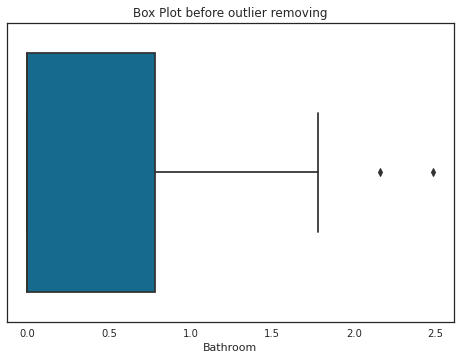

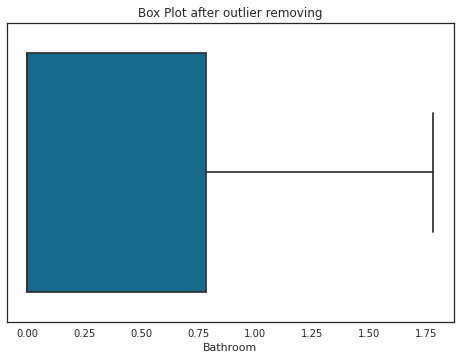

In [34]:
sns.boxplot(df['Bathroom'])
plt.title("Box Plot before outlier removing")
plt.show()
def drop_outliers(df, field_name):
    iqr = 1.5 * (np.percentile(df[field_name], 75) - np.percentile(df[field_name], 25))
    df.drop(df[df[field_name] > (iqr + np.percentile(df[field_name], 75))].index, inplace=True)
    df.drop(df[df[field_name] < (np.percentile(df[field_name], 25) - iqr)].index, inplace=True)
drop_outliers(df, 'Bathroom')
sns.boxplot(df['Bathroom'])
plt.title("Box Plot after outlier removing")
plt.show()

#Executing Linear Regression after removing Outliers

In [35]:
X=df.drop(['Price'],axis=1)
y=df['Price']

In [36]:
X_train,X_test,y_train,y_test=tts(X,y,test_size=0.2,random_state=42)

In [37]:
cols2= ['Suburb', 'Rooms', 'Type', 'Method', 'SellerG', 'Distance', 'Postcode','Bathroom', 'Car', 'Landsize', 'BuildingArea', 'YearBuilt',
'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname','Propertycount']

In [38]:
def linear_reg(X_train,y_train,X_test,y_test):
    linear_reg = LinearRegression()
    linear_reg_model = linear_reg.fit(X_train,y_train)
    print('Train set')
    pred=linear_reg_model.predict(X_train)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_train,pred)))
    print('Test set')
    pred=linear_reg_model.predict(X_test)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_test,pred))) 
   
    plt.scatter(y_test,pred,color='gray')
    plt.xlabel('Actual values')
    plt.ylabel('Predicted values')
    plt.plot(np.unique(y_test), np.poly1d(np.polyfit(y_test, pred, 1))(np.unique(y_test)))
    plt.text(0.6, 0.5, 'R-squared = %0.2f' % r2_score(y_test,pred))
    plt.show()
    df = pd.DataFrame({'Actual': y_test, 'Predicted': pred})
    df1 = df.head(30)
    df1.plot(kind='bar',figsize=(10,8))
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.show()
    visualizer = ResidualsPlot(linear_reg_model)
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.poof() 

Train set
Linear Regression Mean Squared error :30317.458658262094
Linear Regression r2_score :0.7852742058715726
Test set
Linear Regression Mean Squared error :30673.171020889687
Linear Regression r2_score :0.7916100486744291


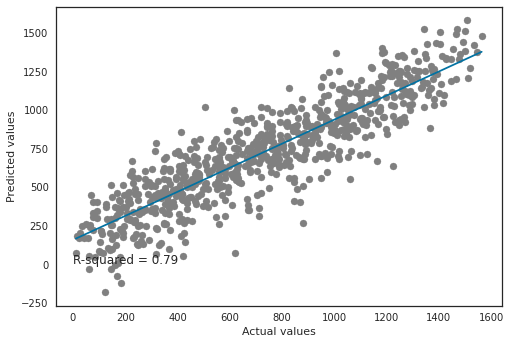

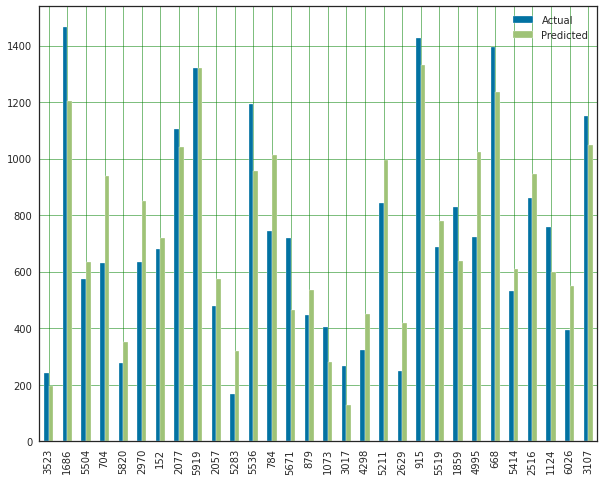

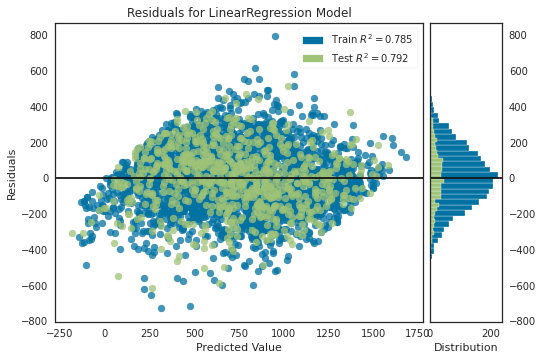

In [39]:
linear_reg(X_train[cols2],y_train,X_test[cols2],y_test)

#Removing 1%, 5%, and 10% of data randomly and imputing the values back

In [40]:
df_Price = df[['Price']]
df_Price['Price_copy_1_percent'] = df_Price[['Price']]
df_Price['Price_copy_5_percent'] = df_Price[['Price']]
df_Price['Price_copy_10_percent'] = df_Price[['Price']]
df_Price

,Price,Price_copy_1_percent,Price_copy_5_percent,Price_copy_10_percent
0,839,839,839,839
3,1291,1291,1291,1291
4,1193,1193,1193,1193
5,878,878,878,878
7,544,544,544,544
...,...,...,...,...
6183,373,373,373,373
6187,206,206,206,206
6189,626,626,626,626
6190,404,404,404,404


Check % missing values in this dataframe

In [41]:
def get_percent_missing(dataframe):
    
    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

In [42]:
print(get_percent_missing(df_Price))

                                 column_name  percent_missing
Price                                  Price              0.0
Price_copy_1_percent    Price_copy_1_percent              0.0
Price_copy_5_percent    Price_copy_5_percent              0.0
Price_copy_10_percent  Price_copy_10_percent              0.0


In [43]:
#Create missing helper fn
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

In [44]:
# Create missing data in each col
create_missing(df_Price, 0.01, 'Price_copy_1_percent')
create_missing(df_Price, 0.05, 'Price_copy_5_percent')
create_missing(df_Price, 0.1, 'Price_copy_10_percent')

In [45]:
# Check % missing after removing data
print(get_percent_missing(df_Price))

                                 column_name  percent_missing
Price                                  Price         0.000000
Price_copy_1_percent    Price_copy_1_percent         1.011984
Price_copy_5_percent    Price_copy_5_percent         5.006658
Price_copy_10_percent  Price_copy_10_percent        10.013316


In [46]:
# Store the indices of missing rows
Price_1_idx = list(np.where(df_Price['Price_copy_1_percent'].isna())[0])
Price_5_idx = list(np.where(df_Price['Price_copy_5_percent'].isna())[0])
Price_10_idx = list(np.where(df_Price['Price_copy_10_percent'].isna())[0])

In [47]:
print(f"Length of Price_1_idx is {len(Price_1_idx)} and it contains {(len(Price_1_idx)/len(df_Price['Price_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_Price['Price_copy_1_percent'])}")
print(f"Length of Price_5_idx is {len(Price_5_idx)} and it contains {(len(Price_5_idx)/len(df_Price['Price_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_Price['Price_copy_1_percent'])}")
print(f"Length of Price_10_idx is {len(Price_10_idx)} and it contains {(len(Price_10_idx)/len(df_Price['Price_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_Price['Price_copy_1_percent'])}")

Length of Price_1_idx is 38 and it contains 1.0119840213049267% of total data in column | Total rows: 3755
Length of Price_5_idx is 188 and it contains 5.006657789613849% of total data in column | Total rows: 3755
Length of Price_10_idx is 376 and it contains 10.013315579227697% of total data in column | Total rows: 3755


In [48]:
df_Price.isnull().sum()

Price                      0
Price_copy_1_percent      38
Price_copy_5_percent     188
Price_copy_10_percent    376
dtype: int64

**Method 1 : Imputation with KNN Imputer**

In [49]:
#mandatory scalling before KNN

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_Price = pd.DataFrame(scaler.fit_transform(df_Price))
df_Price.head()

#knn imputer
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3)
df_Price = pd.DataFrame(imputer.fit_transform(df_Price))

#checking for missing values
df_Price.isnull().sum()

0    0
1    0
2    0
3    0
dtype: int64

In [50]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_Price[0].mean() - df_Price[1].mean())
print('Variance in 5% imputation column is - ', df_Price[0].mean() - df_Price[2].mean())
print('Variance in 10% imputation column is - ', df_Price[0].mean() - df_Price[3].mean())

Variance in 1% imputation column is -  9.081383957609823e-07
Variance in 5% imputation column is -  -7.378624465870232e-07
Variance in 10% imputation column is -  0.0006920604691160737


**Method 2  - By taking mean values of the columns**

In [51]:
#creating missing values for the second time in the dataset for KNN Imputer

df_Price = df[['Price']]

df_Price['Price_copy_1_percent'] = df['Price']
df_Price['Price_copy_5_percent'] = df['Price']
df_Price['Price_copy_10_percent'] = df['Price']
df_Price['sample_num'] = df[['Price']]

def get_percent_missing(dataframe):
    
    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

print(get_percent_missing(df_Price))

def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

create_missing(df_Price, 0.01, 'Price_copy_1_percent')
create_missing(df_Price, 0.05, 'Price_copy_5_percent')
create_missing(df_Price, 0.1, 'Price_copy_10_percent')

print(get_percent_missing(df_Price))

Price_1_idx = list(np.where(df_Price['Price_copy_1_percent'].isna())[0])
Price_5_idx = list(np.where(df_Price['Price_copy_5_percent'].isna())[0])
Price_10_idx = list(np.where(df_Price['Price_copy_10_percent'].isna())[0])

df_Price.isnull().sum()

                                 column_name  percent_missing
Price                                  Price              0.0
Price_copy_1_percent    Price_copy_1_percent              0.0
Price_copy_5_percent    Price_copy_5_percent              0.0
Price_copy_10_percent  Price_copy_10_percent              0.0
sample_num                        sample_num              0.0
                                 column_name  percent_missing
Price                                  Price         0.000000
Price_copy_1_percent    Price_copy_1_percent         1.011984
Price_copy_5_percent    Price_copy_5_percent         5.006658
Price_copy_10_percent  Price_copy_10_percent        10.013316
sample_num                        sample_num         0.000000


Price                      0
Price_copy_1_percent      38
Price_copy_5_percent     188
Price_copy_10_percent    376
sample_num                 0
dtype: int64

In [52]:
#Applying mean to all the columns where data is missing
df_Price['Price_copy_1_percent'] = df_Price['Price_copy_1_percent'].fillna(df_Price['Price_copy_1_percent'].mean())
df_Price['Price_copy_5_percent'] = df_Price['Price_copy_5_percent'].fillna(df_Price['Price_copy_5_percent'].mean())
df_Price['Price_copy_10_percent'] = df_Price['Price_copy_10_percent'].fillna(df_Price['Price_copy_10_percent'].mean())
df_Price.isnull().sum()

Price                    0
Price_copy_1_percent     0
Price_copy_5_percent     0
Price_copy_10_percent    0
sample_num               0
dtype: int64

In [53]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_Price["Price"].mean() - df_Price["Price_copy_1_percent"].mean())
print('Variance in 5% imputation column is - ', df_Price["Price"].mean() - df_Price["Price_copy_5_percent"].mean())
print('Variance in 10% imputation column is - ', df_Price["Price"].mean() - df_Price["Price_copy_10_percent"].mean())

Variance in 1% imputation column is -  -0.7845029871389215
Variance in 5% imputation column is -  -1.6838235683885614
Variance in 10% imputation column is -  -0.48694801328326776


**Method 3 - MICE Algorithm**

In [54]:
#creating missing values for the second time in the dataset for KNN Imputer

df_Price = df[['Price']]

df_Price['Price_copy_1_percent'] = df['Price']
df_Price['Price_copy_5_percent'] = df['Price']
df_Price['Price_copy_10_percent'] = df['Price']
df_Price['sample_num'] = df[['Price']]

def get_percent_missing(dataframe):
    
    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

print(get_percent_missing(df_Price))

def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

create_missing(df_Price, 0.01, 'Price_copy_1_percent')
create_missing(df_Price, 0.05, 'Price_copy_5_percent')
create_missing(df_Price, 0.1, 'Price_copy_10_percent')

print(get_percent_missing(df_Price))

Price_1_idx = list(np.where(df_Price['Price_copy_1_percent'].isna())[0])
Price_5_idx = list(np.where(df_Price['Price_copy_5_percent'].isna())[0])
Price_10_idx = list(np.where(df_Price['Price_copy_10_percent'].isna())[0])

df_Price.isnull().sum()

                                 column_name  percent_missing
Price                                  Price              0.0
Price_copy_1_percent    Price_copy_1_percent              0.0
Price_copy_5_percent    Price_copy_5_percent              0.0
Price_copy_10_percent  Price_copy_10_percent              0.0
sample_num                        sample_num              0.0
                                 column_name  percent_missing
Price                                  Price         0.000000
Price_copy_1_percent    Price_copy_1_percent         1.011984
Price_copy_5_percent    Price_copy_5_percent         5.006658
Price_copy_10_percent  Price_copy_10_percent        10.013316
sample_num                        sample_num         0.000000


Price                      0
Price_copy_1_percent      38
Price_copy_5_percent     188
Price_copy_10_percent    376
sample_num                 0
dtype: int64

In [55]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
imp = IterativeImputer(estimator=lr,missing_values=np.nan, max_iter=10, verbose=2, imputation_order='roman',random_state=0)
data=imp.fit_transform(df)

#checking for missing values
df_Price.isnull().sum()
print('\n Values are fillied with MICE Imputer successfully!')

[IterativeImputer] Completing matrix with shape (3755, 18)
[IterativeImputer] Ending imputation round 1/10, elapsed time 0.05
[IterativeImputer] Change: 0.0, scaled tolerance: 3.7600000000000002 
[IterativeImputer] Early stopping criterion reached.

 Values are fillied with MICE Imputer successfully!


In [56]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_Price["Price"].mean() - df_Price["Price_copy_1_percent"].mean())
print('Variance in 5% imputation column is - ', df_Price["Price"].mean() - df_Price["Price_copy_5_percent"].mean())
print('Variance in 10% imputation column is - ', df_Price["Price"].mean() - df_Price["Price_copy_10_percent"].mean())

Variance in 1% imputation column is -  -0.2703786933536776
Variance in 5% imputation column is -  -1.0833189426526815
Variance in 10% imputation column is -  0.5882221554057878


#Conclusion

To improve the performance of the linear regression model, feature extraction is carried out. All unnecessary variables are identified and removed from the dataset using various methods such as computing the correlation matrix, calculating the p-value, and VIF. Furthermore, the model's accuracy was tested by keeping the outliers and then removing them. It was discovered that removing outliers improves accuracy. Furthermore, to learn about imputation methods, 1%, 5%, and 10% of the data were dropped at random and then imputed using three different methods.

#Assignment Question/Answers

What are the data types? (Only numeric and categorical)

All variables in the given dataset are converted to numerical and categorical types. These are the most preferred data types because the model works best with them.
The numerical variables in this dataset are: Price, Address, YearBuilt, BuildingArea, Landsize, Lattitude, and Longitude.
All of the remaining variables in this dataset are categorical, such as 'Rooms,' 'Bedroom2,' and 'car,' which tell us whether it is present or not.

Are there missing values?

This has no missing values.





What are the likely distributions of the numeric variables?

This dataset's numerical variables are 'Latitude', 'Longitude', 'Postcode', 'SellerG', 'Price', and 'BuildingArea'.
When the graph and q-q plots for these variables were plotted, it was observed that they roughly follow the normal distribution curve.

Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)

The correlation matrix, calculating the p-value, and plotting the independent variable against the target variable are three methods for determining which variables are important for prediction.
The most important variables in all three methods were 'Landsize,' 'BuildingArea,' and 'Rooms'.

Do the training and test sets have the same data?

In [54]:
!pip install tensorflow-data-validation

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [57]:
#Splitting data in training and testing datasets

import numpy as np
df = pd.read_csv("https://github.com/Viral-28/Datascience/raw/main/datasciencemelbourne.csv")
import tensorflow_data_validation as tfdv
train=df.sample(frac=0.8,random_state=200) #80% of data in train set
test=df.drop(train.index) #remaining data in test set

#visualize train
train = tfdv.generate_statistics_from_dataframe(train[['Suburb', 'Rooms', 'Price', 'Method', 'Distance', 'Bedroom2', 'Bathroom', 'BuildingArea', 'YearBuilt', 'Propertycount']])
#visualize test
test = tfdv.generate_statistics_from_dataframe(test[['Suburb', 'Rooms', 'Price', 'Method', 'Distance', 'Bedroom2', 'Bathroom', 'BuildingArea', 'YearBuilt', 'Propertycount']])

#plot train and test together
tfdv.visualize_statistics(lhs_statistics=test, rhs_statistics=train,
                          lhs_name='TESTING_DATA', rhs_name='TRAINING_DATA')

No, the data for training and testing are not the same. The dataset is made up of 80% training data and 20% testing data.

Are the predictor variables independent of all the other predictor variables?

No, none of the predictor variables are independent of the others. The correlation matrix shows that there is multicollinearity among the independent variables. Even when a pair plot was used, some plots revealed a reliance on other predictor variables. In the correlation matrix, for example, the variables room, bedroom2, and bathroom have a high value for each other.


Which predictor variables are the most important?

The most important variables for predicting Price are 'BuildingArea,' 'Bathroom,' 'Rooms,' and 'Bedroom2'. This was determined by calculating the correlation matrix and the VIF and p-values. This values had the highest correlation matrix value in relation to Price, and their p-value was also less than 0.05.

Do the ranges of the predictor variables make sense?

Linear regression works best when all variables have values in similar ranges. When the range for each variable was plotted using a boxplot, the values of all variables were found to be scattered. To begin normalizing the data, identify features with skewness greater than 0.5. The values of those variables should then be normalized. There are 5 such numeric features in this dataset. Normalization is accomplished through the use of the box-cox transformation, and when the boxplot was replotted, it was discovered that all variable values are now in the same range and are not scattered.

What are the distributions of the predictor variables?

When numeric variable distributions were calculated, it was discovered that all variables roughly follow the q-q plot and the bell-curve, indicating that they are normally distributed.

Remove outliers and keep outliers (does it have an effect of the final predictive model)?

The boxplot shows that 'Method,' 'Bathroom,' 'Car,' and 'Rooms' have outliers. When linear regression with outliers was calculated, the model's accuracy on testing data was 79.5%.
Outliers must be treated because they affect the model's accuracy. Outliers can be treated in a variety of ways, including the Quantile method, mean median imputation, and removing outliers.
Because there were outliers for the 'Method,' 'Bathroom,' 'Car,' and 'Rooms' variables, all other values were removed for this dataset by selecting a specific range. When linear regression was applied to the model after removing the outliers, the accuracy for the testing dataset was increased to 81.17%.
As a result, removing the outliers improves the accuracy of this dataset.


Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.




There were no null values in the given dataset. As a result, 1%, 5%, and 10% values were dropped at random. Three different methods were used to impute these values. They were KNN imputer, Mice algorithm, and column mean values imputing. When data was missing, the difference in variance was calculated for each method, and the missing data was then imputed.

#LICENSE

MIT License

Copyright (c) 2023 Viral Jangale

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.


#References

OLS Model- http://net-informations.com/ds/mla/ols.html
Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/
Kaggle Notebook- https://www.kaggle.com/stephaniestallworth/melbourne-housing-market-eda-and-regression
Dataset- https://www.kaggle.com/dansbecker/melbourne-housing-snapshot
https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques
Notebook to help on creating missing data and performing Imputation-https://colab.research.google.com/drive/18Ucw2g9U1kwQIhalRL-MXbKTdqRdRn24?usp=sharing
https://colab.research.google.com/drive/1wEfzH165Ycm_EqVgwSz_r7SvILuj0KRW?usp=sharing (Links to an external site.)
